In [2]:
#* for data manipulation 
import pandas as pd 
import numpy as np 

import tiling_disk_plots as tdp
import tiling_disk_utils as tdu

#* for plotting: 
import matplotlib.pyplot as plt 
import seaborn as sns
%matplotlib inline
sns.set_theme(style="ticks")
sns.set_context("talk")
%matplotlib inline

def kill_big_outliers(df, mode='z', cut_threshold=100):
    """df as usual, z in µm!!!!
    returns: df with z_clean -> z within +-100µm of mean of each
        hexagon """
    for hexagon in df.hex_nr.unique():
        temp_df = df.loc[df.hex_nr == hexagon]
        hex_mean = temp_df[mode].median()
        lower_cut = hex_mean - cut_threshold
        upper_cut = hex_mean + cut_threshold
        def temp_sort_func(z):
            return  z if lower_cut < z < upper_cut else np.NaN
        df['z_clean'] = df[mode].apply(lambda z: temp_sort_func(z))
    return df 

def plot_array_fft_spectrum(arr_fft, ylog=False):
    from scipy.fft import fft
    from scipy.fftpack import fft
    # filter nan values
    arr_fft = arr_fft[~(np.isnan(arr_fft))]
    X = fft(arr_fft)

    # hardening_tripplets_df['z_fft'] = X
    N = len(X)
    n = np.arange(N)
    # get the sampling rate
    sr = 1 / (60*60)
    T = N/sr
    freq = n/T 
    # hardening_tripplets_df['fft_freq'] = freq
    # Get the one-sided specturm
    n_oneside = N//2
    # get the one side frequency
    f_oneside = freq[:n_oneside]

    plt.figure(figsize = (12, 6))
    plt.plot(f_oneside, np.abs(X[:n_oneside]), 'b')
    plt.xlabel('Freq (Hz)')
    plt.ylabel('FFT Amplitude |X(freq)|')
    if ylog: plt.yscale('log')
    plt.show()

### Read data

In [3]:
hardening_tripplets_df = tdu.read_single_measurement('measurements/triplets', '20220401_trip_v6_blue_curing.txt')
hardening_tripplets_df = tdu.add_ring_nr_label(hardening_tripplets_df)
hardening_tripplets_df = tdu.df_convert_unix_to_datetime(hardening_tripplets_df)

before_hardening_tripplets_df = tdu.read_single_measurement('measurements/triplets', '20220331_trip_v6_blue_bfg_vacoff.txt')
before_hardening_tripplets_df = tdu.df_convert_unix_to_datetime(before_hardening_tripplets_df)
# before_hardening_tripplets_df = tdu.add_ring_nr_label(before_hardening_tripplets_df)
before_hardening_tripplets_pt = tdu.point_table(before_hardening_tripplets_df)
before_hardening_tripplets_pt = tdu.add_triplet_color_label(before_hardening_tripplets_pt)

In [4]:
hardening_tripplets_df.head(2)

,run_nr,hex_nr,point,x,y,z,unix_time,ring_nr,datetime
0,1,19,1,-93.20,61.00,-2252.387,1648805280,1,2022-04-01 11:28:00+02:00
1,1,19,1,-93.39,61.19,-2250.825,1648805280,1,2022-04-01 11:28:00+02:00


In [5]:
before_hardening_tripplets_pt.head(2)

,hex_nr,point,unix_time,x,y,z_mean,z_measurement_error,trip_color
0,3,1,1.648722e+09,-28.39,-52.27,-156.935077,0.012411,yellow
1,3,2,1.648722e+09,-29.27,-43.95,-156.945692,0.008466,yellow


### Examine pre glue status

(<Figure size 504x432 with 1 Axes>,
 <AxesSubplot:xlabel='z [µm]', ylabel='Count'>)

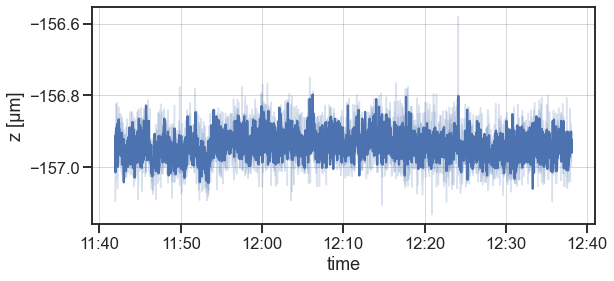

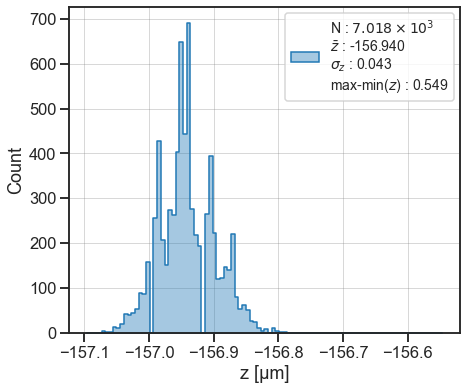

In [6]:
tdp.plot_data_vs_time(before_hardening_tripplets_df)
tdp.ts_hist(before_hardening_tripplets_df)


In [22]:
def ts_hist(
    data,
    mode='z',
    figsize=(7,6),
    color_plot='tab:blue', 
    color_gauss='tab:blue',  
    fit=False,
    fit_window=(-100,100),
    show_datapoints=True,
    fit_start_param = [ 10, 0, 10],
    x_label = 'z [µm]', 
    plot_bins='auto',
    bin_width = 12
            ): 
    bins = np.array(range(fit_window[0],fit_window[1], bin_width)) - 0.5
    fig, ax = plt.subplots(figsize=figsize, nrows=1, ncols=1)
    _, label = tdp.hist_label_data(data[mode])
    sns.histplot(data[mode], kde=False, ax=ax, element='step', color=color_plot,
                 stat='probability', label=label, fill=True, alpha=0.4, 
                 bins=plot_bins,)
    
    counts,bin_edges = np.histogram(data[mode],bins)
    counts = counts/counts.sum()
    bin_centres = (bin_edges[:-1] + bin_edges[1:])/2.
    if show_datapoints:
        ax.scatter(bin_centres, counts, s=4**2, c='black')
    if fit:
        from scipy.optimize import curve_fit
        def fit_function(x, B, mu, sigma):
            return ( B * np.exp(-1.0 * (x - mu)**2 / (2 * sigma**2)))
        popt, pcov = curve_fit(fit_function, xdata=bin_centres, ydata=counts, p0=fit_start_param)
        xspace = np.linspace(fit_window[0], fit_window[1], 100000)
        plt.plot(xspace, fit_function(xspace, *popt),
            color='tab:orange',
            ls='--',
            linewidth=2.5,
            label=f'$\mu$: {tdp.LatexFormat(popt[1])} \n $\sigma$: {tdp.LatexFormat(popt[2])}')


    ax.set_xlabel(x_label)
    plt.legend(bbox_to_anchor=(1, 1), loc='best', borderaxespad=0.4,  fontsize=14)
    plt.grid(c="grey", ls="-", lw=1, alpha=0.3)
    return fig, ax


In [16]:
before_hardening_tripplets_df.z = tdu.subtract_mean(before_hardening_tripplets_df.z)
before_hardening_tripplets_df.z = tdu.convert_mm_to_microns(before_hardening_tripplets_df.z)


In [17]:
before_hardening_tripplets_df = kill_big_outliers(before_hardening_tripplets_df)

(<Figure size 504x432 with 1 Axes>,
 <AxesSubplot:xlabel='z [µm]', ylabel='Count'>)

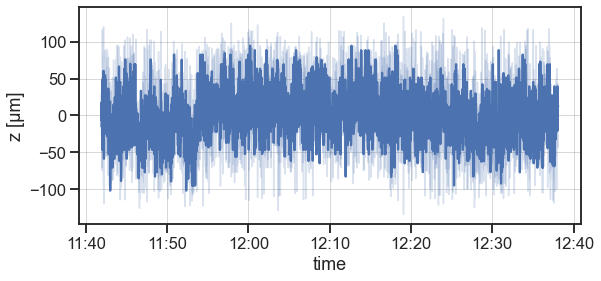

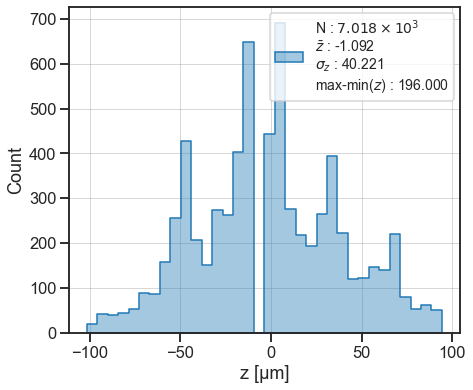

In [18]:
tdp.plot_data_vs_time(before_hardening_tripplets_df, mode='z_clean')
tdp.ts_hist(before_hardening_tripplets_df, mode='z_clean')


(<Figure size 504x432 with 1 Axes>,
 <AxesSubplot:xlabel='z [µm]', ylabel='Probability'>)

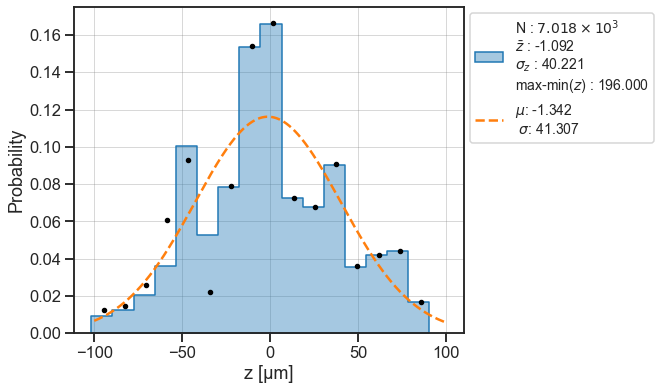

In [23]:
df = before_hardening_tripplets_df
plot_bins = np.arange(df.z_clean.min(), df.z_clean.max(),12)
ts_hist(before_hardening_tripplets_df, mode='z_clean', plot_bins=plot_bins, fit=True)
#todo problem: bei chi^2 wenn leere bins dann geht alles flöten 

In [ ]:
before_hardening_tripplets_df = tdu.add_triplet_color_label(before_hardening_tripplets_df)

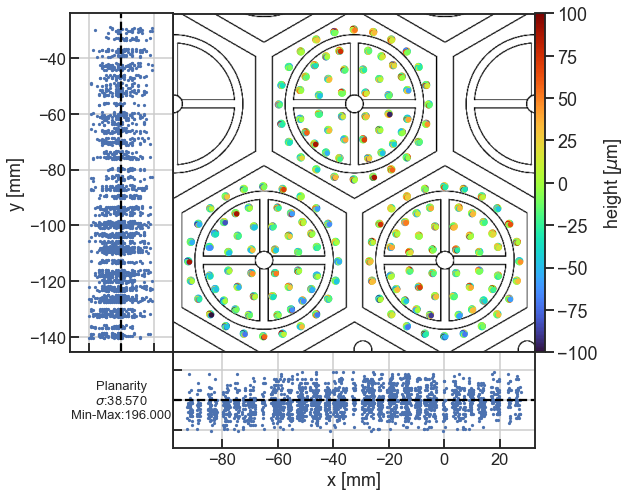

In [ ]:
df = before_hardening_tripplets_df.loc[before_hardening_tripplets_df.trip_color=='yellow',:]
fig, ax = tdp.plot_table_hexagon_flatness(df, mode='z_clean', figsize=(8,8), size=4**2)


In [ ]:
before_hardening_tripplets_df['z_clean'].to_numpy()

array([-21.62838416,   8.37161584,   2.37161584, ...,  14.37161584,
        -9.62838416,  33.37161584])

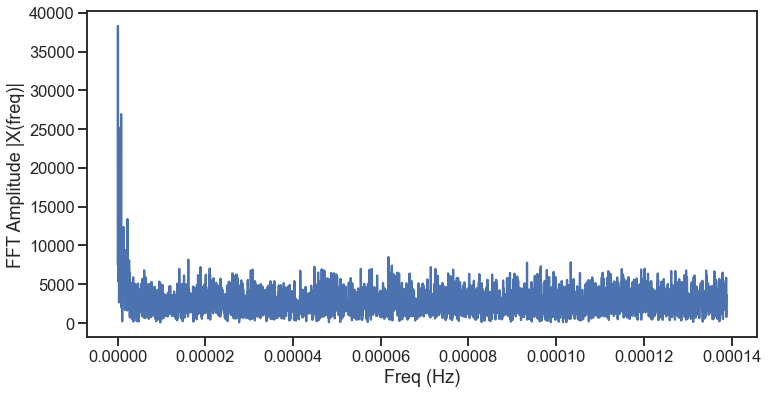

In [ ]:
plot_array_fft_spectrum(before_hardening_tripplets_df['z_clean'].to_numpy())

In [ ]:
df = before_hardening_tripplets_df
df = tdu.outlier_discrim(df, percentile=99)
df.z = tdu.convert_mm_to_microns(df.z)
df.z = tdu.subtract_mean(df.z)

lower cut -107.62838415703868
upper cut 118.37161584296041


In [ ]:
df = tdu.outlier_discrim(df, mode='z', percentile=99)

lower cut -107628.3841550353
upper cut 118371.6158449638


(<Figure size 648x288 with 1 Axes>,
 <AxesSubplot:xlabel='time', ylabel='z [µm]'>)

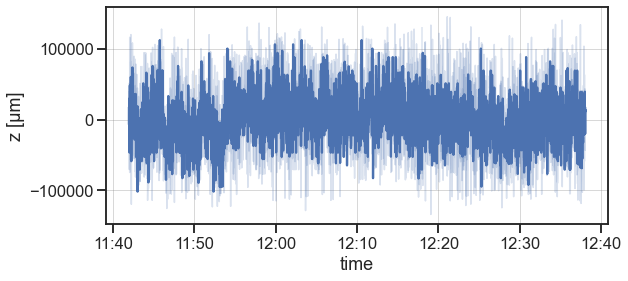

In [ ]:
tdp.plot_data_vs_time(df, mode='z_tidy')

N : $7.018 \times 10^{3}$
$\bar{z}$ : -115.700
$\sigma_{z}$ : $4.130 \times 10^{4}$
max-min($z$) : $2.140 \times 10^{5}$


C:\Users\Domin\AppData\Local\Temp\ipykernel_5308\539377739.py:1: DeprecationWarning: Using .default_errordef() is deprecated. Use .errordef instead
  tdp.ts_fit_hist(df, mode='z_tidy')


(<Figure size 576x576 with 2 Axes>,
 (<AxesSubplot:title={'center':'Hist-Fit to data'}, xlabel='z_tidy', ylabel='Count'>,
  <AxesSubplot:xlabel='z [µm]'>))

<Figure size 432x288 with 0 Axes>

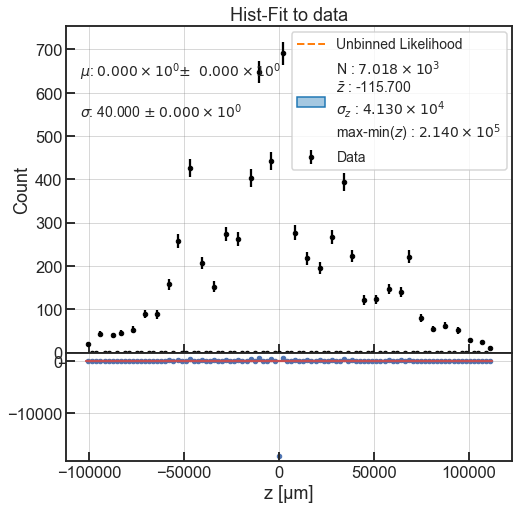

In [ ]:
tdp.ts_fit_hist(df, mode='z_tidy')

In [ ]:
before_hardening_tripplets_pt['z_mean'].describe()

count    540.000000
mean    -156.940375
std        0.020913
min     -157.013846
25%     -156.954308
50%     -156.939769
75%     -156.924615
max     -156.879538
Name: z_mean, dtype: float64

In [ ]:
before_hardening_tripplets_pt.keys()

Index(['hex_nr', 'point', 'unix_time', 'x', 'y', 'z_mean',
       'z_measurement_error', 'trip_color'],
      dtype='object')

In [1]:
min_bht = before_hardening_tripplets_pt.z_mean.min()
mean_bht = before_hardening_tripplets_pt.z_mean.mean()
max_bht = before_hardening_tripplets_pt.z_mean.max()
fig, ax = tdp.full_hexagon_plot(before_hardening_tripplets_pt, size=5**2, cbar_norm=(min_bht, mean_bht, max_bht), cmap='turbo')
ax.set_title('Before Glue: No Vacuum')

NameError: name 'before_hardening_tripplets_pt' is not defined

# Proceed with before glue as reference

In [ ]:
before_hardening_tripplets_pt
before_hardening_tripplets_pt = tdu.df_convert_unix_to_datetime(before_hardening_tripplets_pt)

In [ ]:
before_hardening_tripplets_pt.head(2)

,hex_nr,point,unix_time,x,y,z_mean,z_measurement_error,trip_color,datetime
0,3,1,1.648722e+09,-28.39,-52.27,-156.935077,0.012411,yellow,2022-03-31 12:19:30.615384576+02:00
1,3,2,1.648722e+09,-29.27,-43.95,-156.945692,0.008466,yellow,2022-03-31 12:19:37.153846272+02:00


(<Figure size 648x288 with 1 Axes>,
 <AxesSubplot:xlabel='time', ylabel='z [µm]'>)

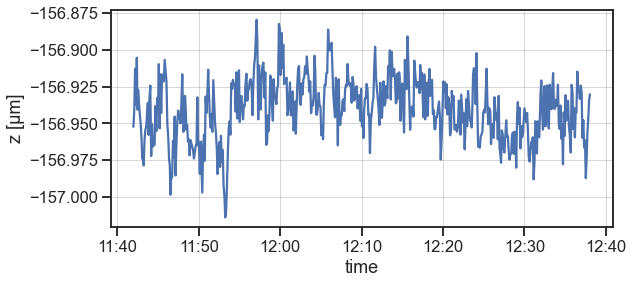

In [ ]:
tdp.plot_data_vs_time(before_hardening_tripplets_pt, mode="z_mean")

In [ ]:
hardening_tripplets_df = hardening_tripplets_df.loc[hardening_tripplets_df.run_nr==1,:]

(<Figure size 648x288 with 1 Axes>,
 <AxesSubplot:xlabel='time', ylabel='z [µm]'>)

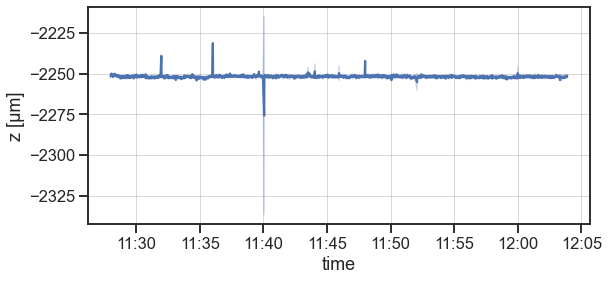

In [ ]:
tdp.plot_data_vs_time(hardening_tripplets_df, mode="z")

In [ ]:
med = hardening_tripplets_df.z.median()
hardening_tripplets_df.z = hardening_tripplets_df.z.apply(lambda z: z - med)

(<Figure size 648x288 with 1 Axes>,
 <AxesSubplot:xlabel='time', ylabel='z [µm]'>)

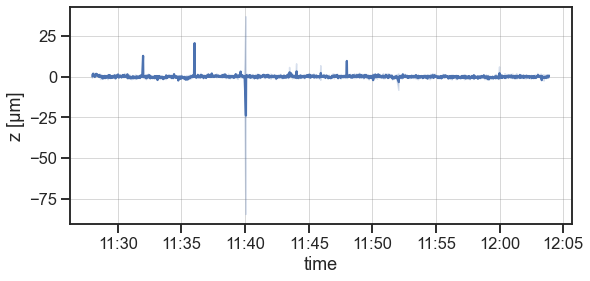

In [ ]:
tdp.plot_data_vs_time(hardening_tripplets_df, mode="z")

(<Figure size 504x432 with 1 Axes>,
 <AxesSubplot:xlabel='z [µm]', ylabel='Count'>)

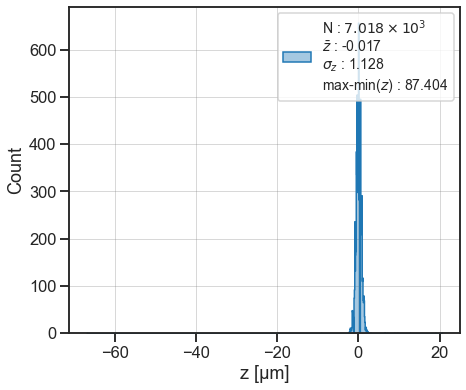

In [ ]:
tdp.ts_hist(hardening_tripplets_df, mode='z')

In [ ]:
hardening_tripplets_df.z = tdu.convert_mm_to_microns(hardening_tripplets_df.z)

(<Figure size 648x288 with 1 Axes>,
 <AxesSubplot:xlabel='time', ylabel='z [µm]'>)

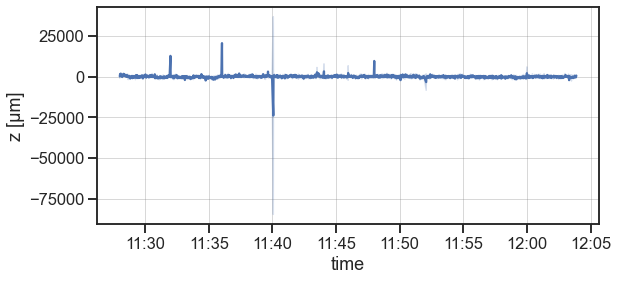

In [ ]:
tdp.plot_data_vs_time(hardening_tripplets_df, mode='z')

(<Figure size 504x432 with 1 Axes>,
 <AxesSubplot:xlabel='z [µm]', ylabel='Count'>)

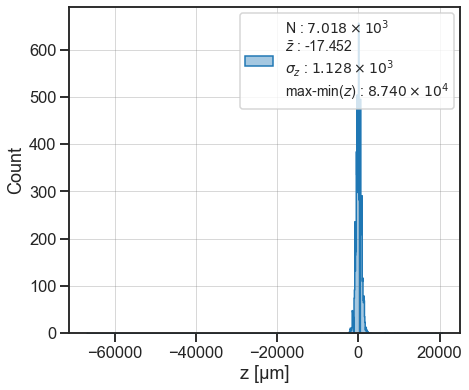

In [ ]:
tdp.ts_hist(hardening_tripplets_df, mode='z')

In [ ]:
hardening_tripplets_df = tdu.add_triplet_color_label(hardening_tripplets_df)

c:\Users\Domin\Nextcloud\Master\Disk_Tiling_Measurements\Fwd MADMAX Laser Scanning\tiling_disk_plots.py:156: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


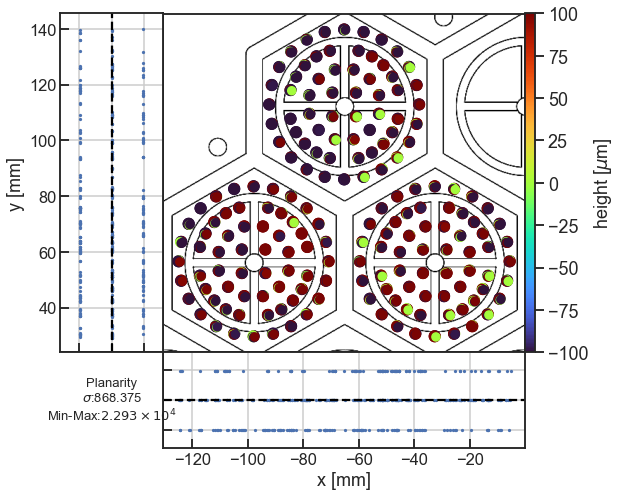

In [ ]:
df = hardening_tripplets_df.loc[hardening_tripplets_df.trip_color=='blue',:]
fig, ax = tdp.plot_table_hexagon_flatness(df, mode='z', )


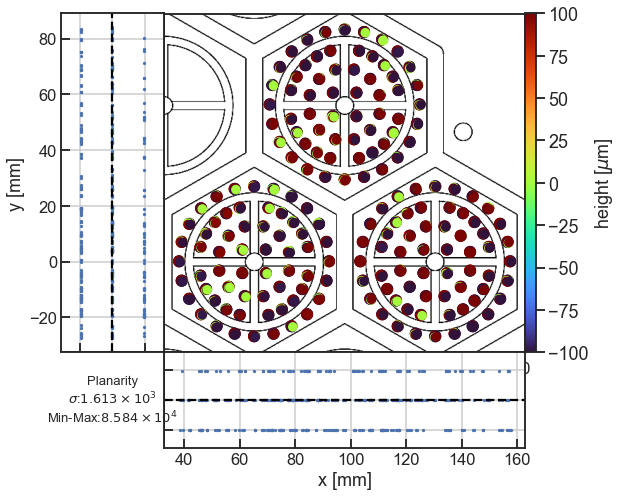

In [ ]:
df = hardening_tripplets_df.loc[hardening_tripplets_df.trip_color=='brown',:]
fig, ax = tdp.plot_table_hexagon_flatness(df, mode='z', )


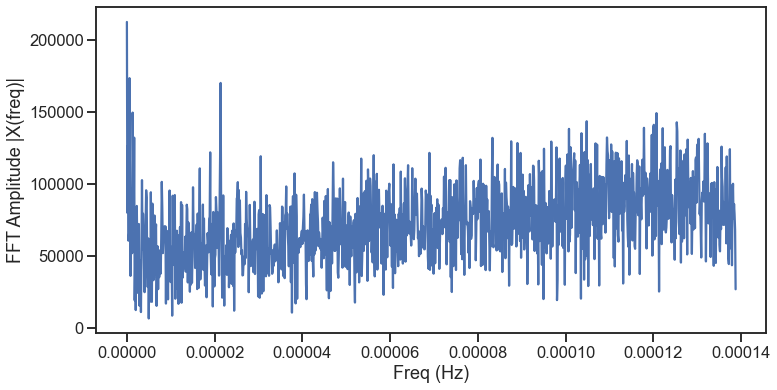

In [ ]:
plot_array_fft_spectrum(df.z.to_numpy(), ylog=False)

In [ ]:
def kill_big_outliers(df, mode='z', cut_threshold=100):
    """df as usual, z in µm!!!!
    returns: df with z_clean -> z within +-100µm of mean of each
        hexagon """
    for hexagon in df.hex_nr.unique():
        temp_df = df.loc[df.hex_nr == hexagon]
        hex_mean = temp_df[mode].median()
        lower_cut = hex_mean - cut_threshold
        upper_cut = hex_mean + cut_threshold
        def temp_sort_func(z):
            return  z if lower_cut < z < upper_cut else np.NaN
        df['z_clean'] = df[mode].apply(lambda z: temp_sort_func(z))
    return df 

In [ ]:
hardening_tripplets_df = kill_big_outliers(hardening_tripplets_df, 
                                            mode='z')

(<Figure size 504x432 with 1 Axes>,
 <AxesSubplot:xlabel='z [µm]', ylabel='Count'>)

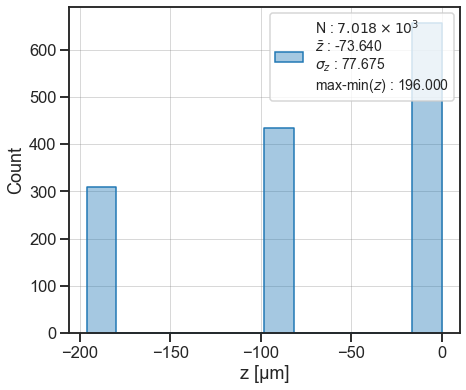

In [ ]:
tdp.ts_hist(hardening_tripplets_df, mode='z_clean')

(<Figure size 648x288 with 1 Axes>,
 <AxesSubplot:xlabel='time', ylabel='z [µm]'>)

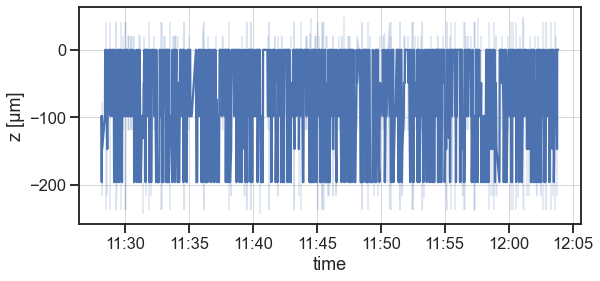

In [ ]:
tdp.plot_data_vs_time(hardening_tripplets_df, mode='z_clean')

c:\Users\Domin\Nextcloud\Master\Disk_Tiling_Measurements\Fwd MADMAX Laser Scanning\tiling_disk_plots.py:156: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


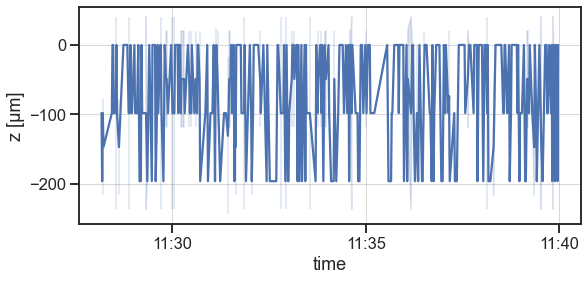

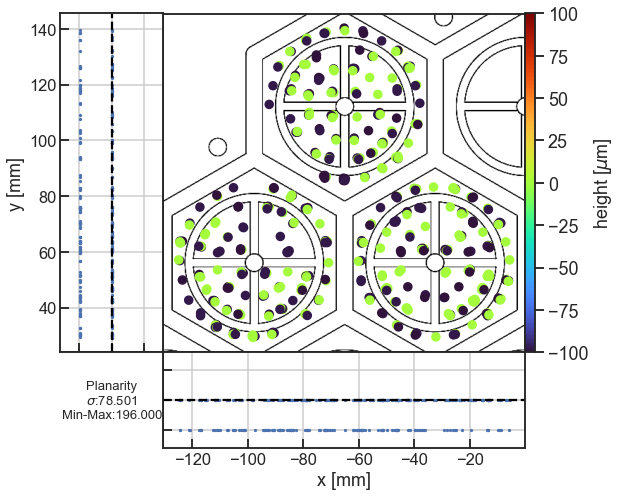

In [ ]:
df = hardening_tripplets_df.loc[hardening_tripplets_df.trip_color=='blue',:]
tdp.plot_data_vs_time(df, mode='z_clean')
fig, ax = tdp.plot_table_hexagon_flatness(df,mode='z_clean', )


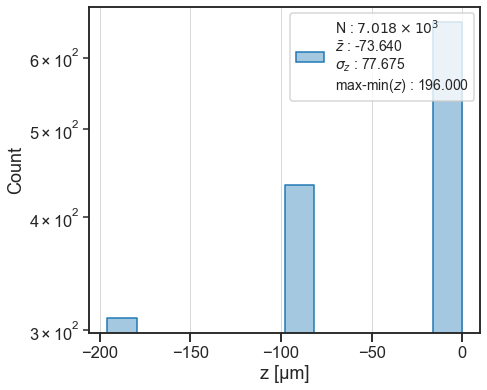

In [ ]:
tdp.ts_hist(hardening_tripplets_df, mode='z_clean')
plt.yscale('log')

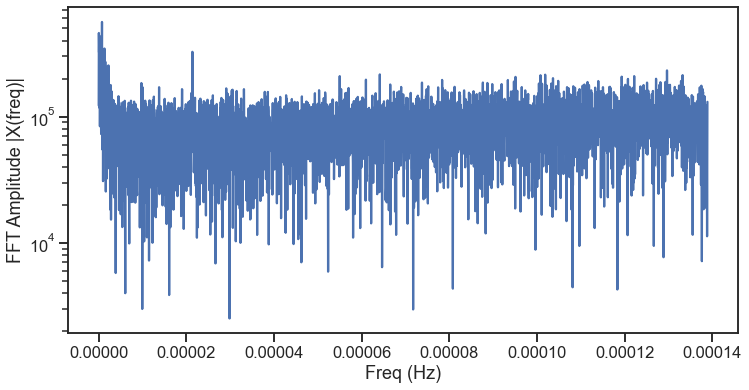

In [ ]:
from scipy.fftpack import fft
X = fft(hardening_tripplets_df['z'].to_numpy())
hardening_tripplets_df['z_fft'] = X
N = len(X)
n = np.arange(N)
# get the sampling rate
sr = 1 / (60*60)
T = N/sr
freq = n/T 
hardening_tripplets_df['fft_freq'] = freq
# Get the one-sided specturm
n_oneside = N//2
# get the one side frequency
f_oneside = freq[:n_oneside]

plt.figure(figsize = (12, 6))
plt.plot(f_oneside, np.abs(X[:n_oneside]), 'b')
plt.xlabel('Freq (Hz)')
plt.ylabel('FFT Amplitude |X(freq)|')
plt.yscale('log')
plt.show()

In [ ]:
zs = hardening_tripplets_df['z'].to_numpy()

In [ ]:
fft_z = fft(zs)

In [ ]:
fft_z

array([-122480.0000005      -0.j        ,
       -421321.97666137-183021.2736878j ,
        322701.49842701  +2413.07100348j, ...,
        426772.69985243-106514.80708069j,
        322701.49842701  -2413.07100348j,
       -421321.97666137+183021.2736878j ])

C:\Users\Domin\Anaconda3\envs\py_disk_env\lib\site-packages\numpy\lib\histograms.py:852: ComplexWarning: Casting complex values to real discards the imaginary part
  indices = f_indices.astype(np.intp)
C:\Users\Domin\Anaconda3\envs\py_disk_env\lib\site-packages\matplotlib\transforms.py:775: ComplexWarning: Casting complex values to real discards the imaginary part
  points = np.asarray(points, float)


(array([2.000e+00, 5.000e+00, 2.300e+01, 9.790e+02, 2.514e+03, 2.776e+03,
        6.750e+02, 3.500e+01, 7.000e+00, 2.000e+00]),
 array([-421321.97666137-183021.2736878j ,
        -336512.50900999-154067.66561095j,
        -251703.04135861-125114.0575341j ,
        -166893.57370723 -96160.44945725j,
         -82084.10605585 -67206.8413804j ,
           2725.36159553 -38253.23330355j,
          87534.82924691  -9299.6252267j ,
         172344.29689829 +19653.98285015j,
         257153.76454967 +48607.590927j  ,
         341963.23220105 +77561.19900385j,
         426772.69985243+106514.80708069j]),
 <BarContainer object of 10 artists>)

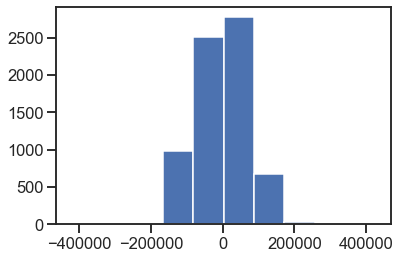

In [ ]:
filter_arr = -1e8 < fft_z.real 
fft_z_filter = fft_z[filter_arr]
plt.hist(fft_z_filter)

In [ ]:
from scipy.fft import ifft
zs_ifft = ifft(fft_z_filter)

(array([1.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        1.000e+00, 7.007e+03, 6.000e+00, 3.000e+00]),
 array([-66817. +3.54529819e-13j, -58076.6+2.88271435e-13j,
        -49336.2+2.22013051e-13j, -40595.8+1.55754667e-13j,
        -31855.4+8.94962828e-14j, -23115. +2.32378987e-14j,
        -14374.6-4.30204855e-14j,  -5634.2-1.09278870e-13j,
          3106.2-1.75537254e-13j,  11846.6-2.41795638e-13j,
         20587. -3.08054022e-13j]),
 <BarContainer object of 10 artists>)

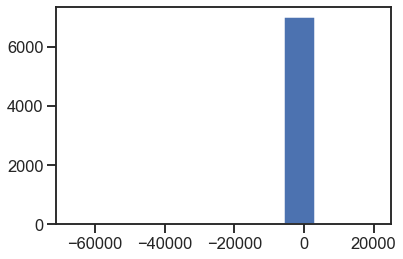

In [ ]:
plt.hist(zs_ifft)

(-2260.0, -2240.0)

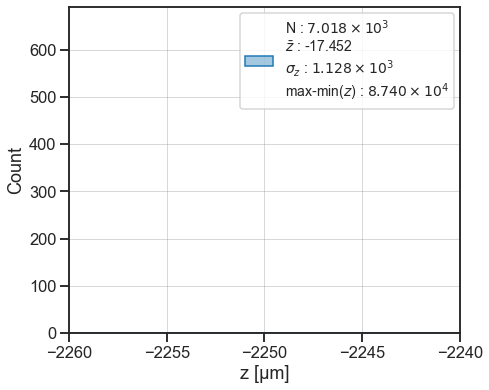

In [ ]:

# hardening_tripplets_df['z_fft'] = hardening_tripplets_df['z'].apply(lambda z : fft(z))
tdp.ts_hist(hardening_tripplets_df)
ax = plt.gca()
ax.set_xlim(-2260,-2240)

In [ ]:
# tdp.ts_fit_hist(steel_diff_vac_novac,mode='z_mean', bin_plot_range= (-2255,-2248), bin_size = 0.1)

### Split Data into runs

In [ ]:
def calc_df_normalize(dataframe, mode='z'):
    mode_mean = dataframe[mode].mean()
    mode_sig = dataframe[mode].std()
    dataframe[f'{mode}_norm'] = (dataframe[mode] - mode_mean) / mode_sig
    return dataframe

In [ ]:
curing_trip = hardening_tripplets_df
curing_trip = calc_df_normalize(curing_trip)

In [ ]:
z_n_std = curing_trip.z_norm.std()
# print(z_n_std)
curing_trip['z_tidy'] = curing_trip['z_norm'].apply(lambda z: z if np.abs(z) < (3 * z_n_std) else np.nan) 

In [ ]:
curing_trip.z_tidy.describe()


count    7008.000000
mean       -0.001942
std         0.592218
min        -2.148793
25%        -0.417916
50%         0.015467
75%         0.361111
max         2.785046
Name: z_tidy, dtype: float64

neue column zz: x - µ / \sigma 
neue column : zz if abs(z) in 3*sig else nan oderso
dann filter dafuer und profit

In [ ]:
measurements_dict = {}
for run in hardening_tripplets_df.run_nr.unique(): 
    data = hardening_tripplets_df.loc[hardening_tripplets_df.run_nr == run, :]
    # print(data)
    measurements_dict[f'run_nr_{run}'] = data

In [ ]:
measurements_dict['run_nr_1'].keys()

Index(['run_nr', 'hex_nr', 'point', 'x', 'y', 'z', 'unix_time', 'ring_nr',
       'datetime', 'trip_color', 'z_clean', 'z_fft', 'fft_freq', 'z_norm',
       'z_tidy'],
      dtype='object')

Text(0.5, 1.0, 'temp-data')

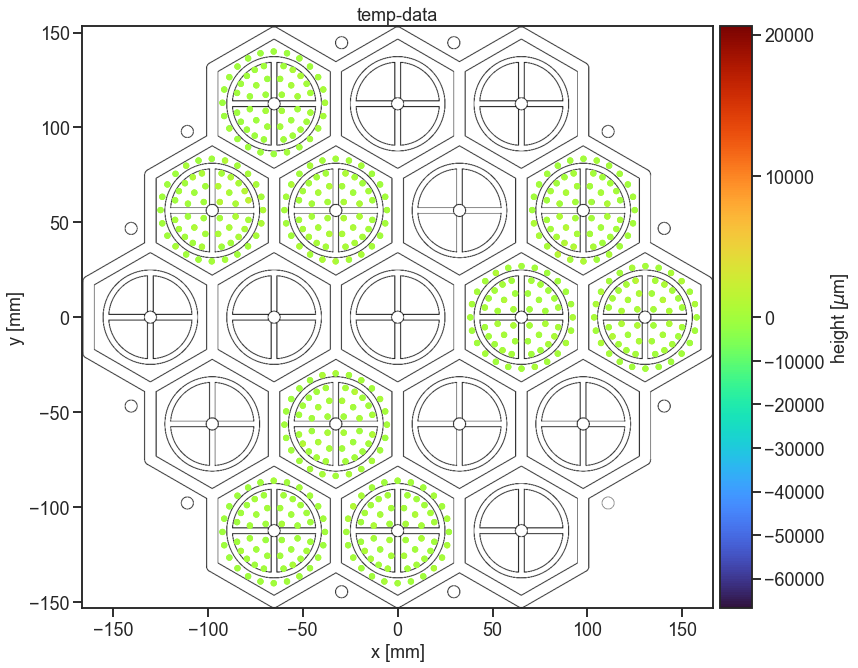

In [ ]:
temp_data = measurements_dict['run_nr_1']
temp_data = tdu.df_convert_unix_to_datetime(temp_data)
min_bht = temp_data.z.min()
mean_bht = temp_data.z.mean()
max_bht = temp_data.z.max()
fig, ax = tdp.full_hexagon_plot(temp_data,mode='z', size=3**2, cbar_norm=(min_bht, mean_bht, max_bht), cmap='turbo')
ax.set_title('temp-data')

(array([1.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        1.000e+00, 7.007e+03, 6.000e+00, 3.000e+00]),
 array([-66817. , -58076.6, -49336.2, -40595.8, -31855.4, -23115. ,
        -14374.6,  -5634.2,   3106.2,  11846.6,  20587. ]),
 <BarContainer object of 10 artists>)

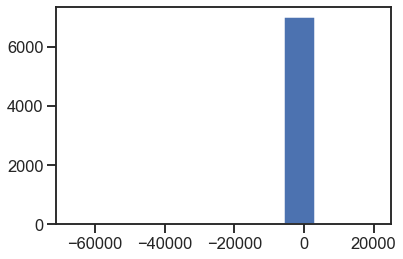

In [ ]:
plt.hist(temp_data.z)

(<Figure size 648x288 with 1 Axes>,
 <AxesSubplot:xlabel='time', ylabel='z [µm]'>)

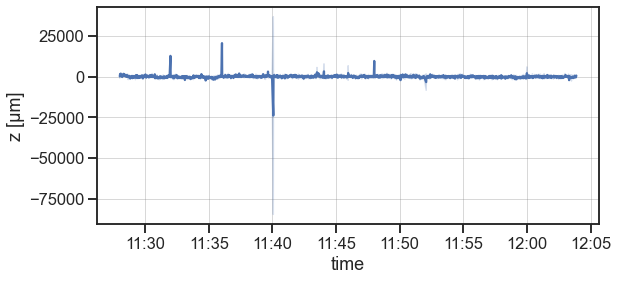

In [ ]:
tdp.plot_data_vs_time(temp_data, mode="z")

In [ ]:
measurements_dict_pt = {key: tdu.point_table(data) for key, data in measurements_dict.items()}

In [ ]:
for run_nr, data in measurements_dict_pt.items(): 
    data['run_nr'] = run_nr.split('_')[2]

In [ ]:
measurements_dict_pt['run_nr_1']

,hex_nr,point,unix_time,x,y,z_mean,z_measurement_error,run_nr
0,3,1,1.648807e+09,-28.39,-52.27,-852.076923,684.148592,1
1,3,2,1.648807e+09,-29.27,-43.95,37.384615,165.442192,1
2,3,3,1.648807e+09,-23.44,-47.32,-188.153846,190.798690,1
3,3,4,1.648807e+09,-20.07,-53.15,195.000000,146.482101,1
4,3,5,1.648807e+09,-13.31,-51.33,-375.769231,149.093837,1
...,...,...,...,...,...,...,...,...
535,19,56,1.648805e+09,-90.89,30.43,-203.153846,65.892044,1
536,19,57,1.648806e+09,-84.38,33.13,-233.230769,180.465511,1
537,19,58,1.648806e+09,-78.79,37.42,-150.538462,200.065363,1
538,19,59,1.648806e+09,-74.50,43.01,427.846154,123.217941,1


In [ ]:
temp_data.head(3)

,run_nr,hex_nr,point,x,y,z,unix_time,ring_nr,datetime,trip_color,z_clean,z_fft,fft_freq,z_norm,z_tidy
0,1,19,1,-93.20,61.00,-586.0,1648805280,1,2022-04-01 11:28:00+02:00,blue,NaN,-1224800000000.0-0.00000000j,0.000000e+00,-0.503884,-0.503884
1,1,19,1,-93.39,61.19,976.0,1648805280,1,2022-04-01 11:28:00+02:00,blue,NaN,-421321.976661-183021.273688j,3.958076e-08,0.880462,0.880462
2,1,19,1,-93.64,61.25,1074.0,1648805281,1,2022-04-01 11:28:01+02:00,blue,NaN,322701.4984207+2413.0710030j,7.916152e-08,0.967316,0.967316


Text(0.5, 1.0, 'temp-data')

posx and posy should be finite values


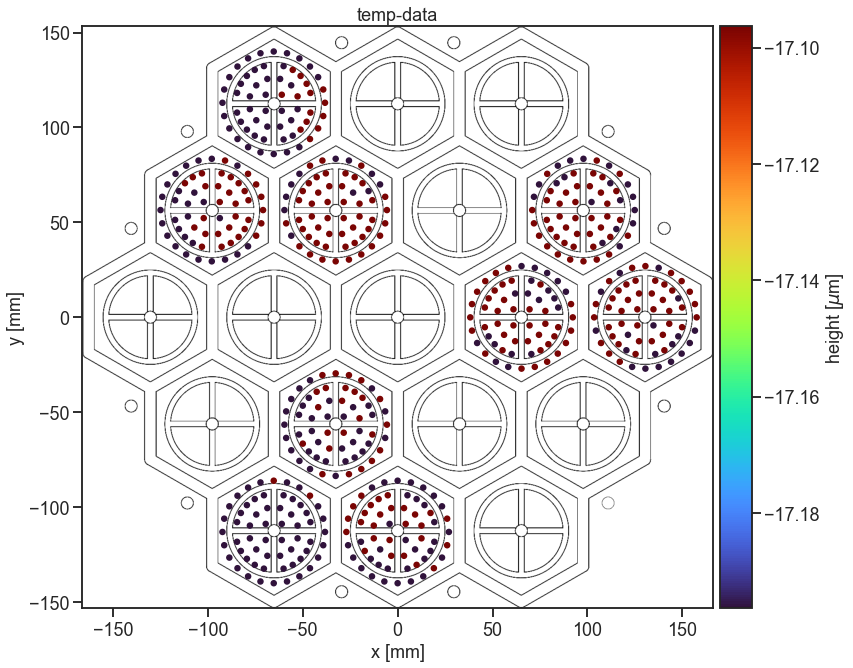

In [ ]:
temp_data = measurements_dict_pt['run_nr_1']
temp_data = tdu.df_convert_unix_to_datetime(temp_data)
min_bht = temp_data.z_mean.min()
mean_bht = temp_data.z_mean.mean()
max_bht = temp_data.z_mean.max()
fig, ax = tdp.full_hexagon_plot(temp_data, size=5**2, cbar_norm=(mean_bht-0.05, mean_bht, mean_bht+0.05), cmap='turbo')
ax.set_title('temp-data')

### testgelände

In [ ]:
temp_data = before_hardening_tripplets_df

In [ ]:
temp_data = tdu.add_triplet_color_label(temp_data)
t_df = temp_data.loc[temp_data.trip_color=='blue',:]

c:\Users\Domin\Nextcloud\Master\Disk_Tiling_Measurements\Fwd MADMAX Laser Scanning\tiling_disk_plots.py:156: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


(<Figure size 576x576 with 5 Axes>,
 (<AxesSubplot:>,
  <AxesSubplot:xlabel='x [mm]'>,
  <AxesSubplot:ylabel='y [mm]'>))

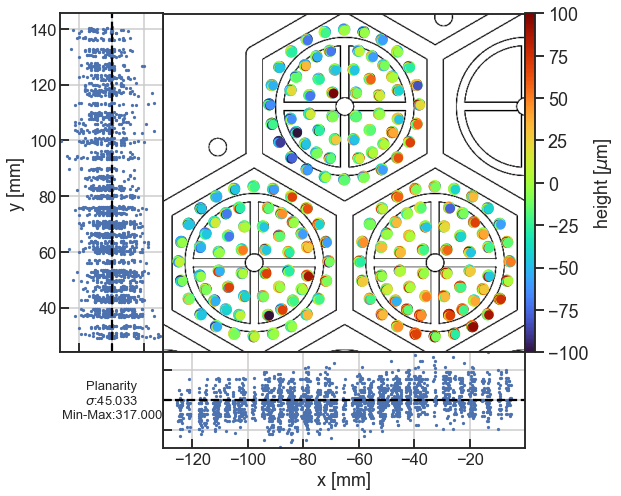

In [ ]:
tdp.plot_table_hexagon_flatness(t_df, mode='z')

### weiter

(<Figure size 648x288 with 1 Axes>,
 <AxesSubplot:xlabel='time', ylabel='z [µm]'>)

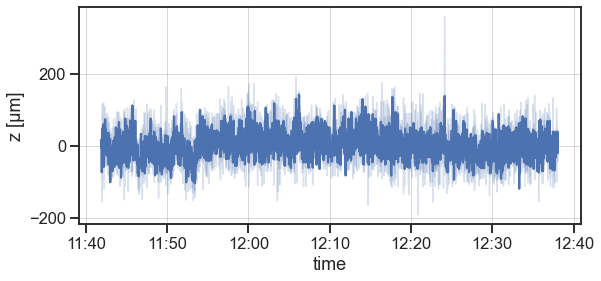

In [ ]:
tdp.plot_data_vs_time(temp_data, mode="z")

In [ ]:
temp_data = tdu.outlier_discrim(temp_data, mode='z_mean',  percentile=99)

lower cut -2252.7655288461538
upper cut -2250.639876153846


(array([ 10.,  25.,  53., 117., 139., 109.,  54.,  14.,   6.,   7.]),
 array([-2252.74030769, -2252.53402308, -2252.32773846, -2252.12145385,
        -2251.91516923, -2251.70888462, -2251.5026    , -2251.29631538,
        -2251.09003077, -2250.88374615, -2250.67746154]),
 <BarContainer object of 10 artists>)

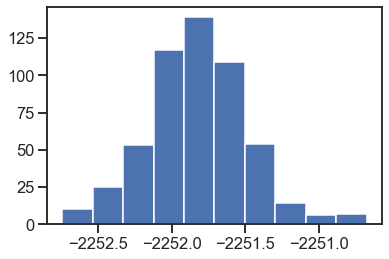

In [ ]:
plt.hist(temp_data.z_mean_tidy)

(<Figure size 648x288 with 1 Axes>,
 <AxesSubplot:xlabel='time', ylabel='z [µm]'>)

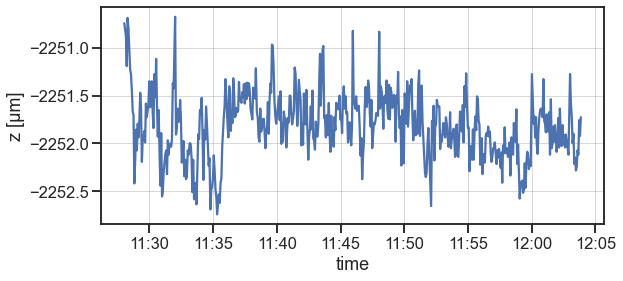

In [ ]:
tdp.plot_data_vs_time(temp_data, mode="z_mean_tidy")

In [ ]:
# for key, data in measurements_dict_pt.items(): 
#     run_nr = int(key.split('_')[2])
#     fig, ax = tdp.full_hexagon_plot(data, mode=('z_mean'), size=5**2, cbar_norm=(-157.056615, -156.981132, -156.879538), cmap='turbo', title=f'Hour {run_nr -1}')
#     # fig.savefig(f'Vac_timestory/{run_nr}_Measurement.png', dpi='figure', format='png', metadata=None,
#     #     bbox_inches=None, pad_inches=0.1,
#     #     facecolor='auto', edgecolor='auto',
#     #     backend=None
#     #    )
#     # plt.close()

In [ ]:
measurements_dict_pt = {key: tdu.add_triplet_color_label(data) for key, data in measurements_dict_pt.items()}

In [ ]:
measurements_dict_pt = {key: tdu.df_convert_unix_to_datetime(data) for key, data in measurements_dict_pt.items()}

In [ ]:
measurements_dict_pt["run_nr_1"].head(5)

,hex_nr,point,unix_time,x,y,z_mean,z_measurement_error,run_nr,datetime,trip_color
0,3,1,1.648807e+09,-28.39,-52.27,-2252.653077,0.684149,1,2022-04-01 11:52:06.461538560+02:00,yellow
1,3,2,1.648807e+09,-29.27,-43.95,-2251.763615,0.165442,1,2022-04-01 11:52:10.615384576+02:00,yellow
2,3,3,1.648807e+09,-23.44,-47.32,-2251.989154,0.190799,1,2022-04-01 11:52:14.384615424+02:00,yellow
3,3,4,1.648807e+09,-20.07,-53.15,-2251.606000,0.146482,1,2022-04-01 11:52:18.230769152+02:00,yellow
4,3,5,1.648807e+09,-13.31,-51.33,-2252.176769,0.149094,1,2022-04-01 11:52:22+02:00,yellow


In [ ]:
#for data in measurements_dict_pt.values(): 
#    data = data.loc[data.hex_nr==11 or data.hex_nr==10,:]
#    tdp.plot_data_vs_time(data, mode="z_mean")

In [ ]:
def combine_measurements(data_signal,data_background, signalmode='z_mean', backgroundmode='z_mean'): 
        # Takes only point_tables
    delta_df = data_signal.copy()
    data
    delta_df[f'{signalmode}'] = data_signal[f'{signalmode}'] - data_background[f'{backgroundmode}']

    if 'unix_time' in data_signal.keys(): 
    #     delta_df['datetime'] = data_signal['datetime']
        delta_df['unix_time'] = data_signal['unix_time']
    if 'z_measurement_error' in signal.keys():
        delta_df['z_measurement_error'] = quad_sum(data_signal['z_measurement_error'],
                                                data_background['z_measurement_error'])
    return delta_df 

In [ ]:
temp_data.z_mean = temp_data.z_mean_tidy

In [ ]:
measurements_dict_pt = {key: tdu.combine_mean_measurements(data, temp_data) for key, data in measurements_dict_pt.items()}

In [ ]:
for key, data in measurements_dict_pt.items():
    data['z_mean'] = data['z_mean'].apply(lambda z: z*1e3) #* mm -> µm
    data['z_measurement_error'] = data['z_measurement_error'].apply(lambda z: z*1e3) #* mm -> µm
    measurements_dict_pt[key] = data

In [ ]:
measurements_dict_pt['run_nr_1']

,hex_nr,point,unix_time,x,y,z_mean,z_measurement_error,run_nr,datetime,trip_color
0,3,1,1.648807e+09,-28.39,-52.27,0.0,967.532217,1,2022-04-01 11:52:06.461538560+02:00,yellow
1,3,2,1.648807e+09,-29.27,-43.95,0.0,233.970592,1,2022-04-01 11:52:10.615384576+02:00,yellow
2,3,3,1.648807e+09,-23.44,-47.32,0.0,269.830096,1,2022-04-01 11:52:14.384615424+02:00,yellow
3,3,4,1.648807e+09,-20.07,-53.15,0.0,207.156975,1,2022-04-01 11:52:18.230769152+02:00,yellow
4,3,5,1.648807e+09,-13.31,-51.33,0.0,210.850527,1,2022-04-01 11:52:22+02:00,yellow
...,...,...,...,...,...,...,...,...,...,...
535,19,56,1.648805e+09,-90.89,30.43,0.0,93.185424,1,2022-04-01 11:31:38+02:00,blue
536,19,57,1.648806e+09,-84.38,33.13,0.0,255.216774,1,2022-04-01 11:31:42.076923136+02:00,blue
537,19,58,1.648806e+09,-78.79,37.42,0.0,282.935150,1,2022-04-01 11:31:45.923076864+02:00,blue
538,19,59,1.648806e+09,-74.50,43.01,0.0,174.256484,1,2022-04-01 11:31:49.846153728+02:00,blue


c:\Users\Domin\Nextcloud\Master\Disk_Tiling_Measurements\Fwd MADMAX Laser Scanning\tiling_disk_plots.py:54: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(ncols=1, nrows=1, figsize=figsize)


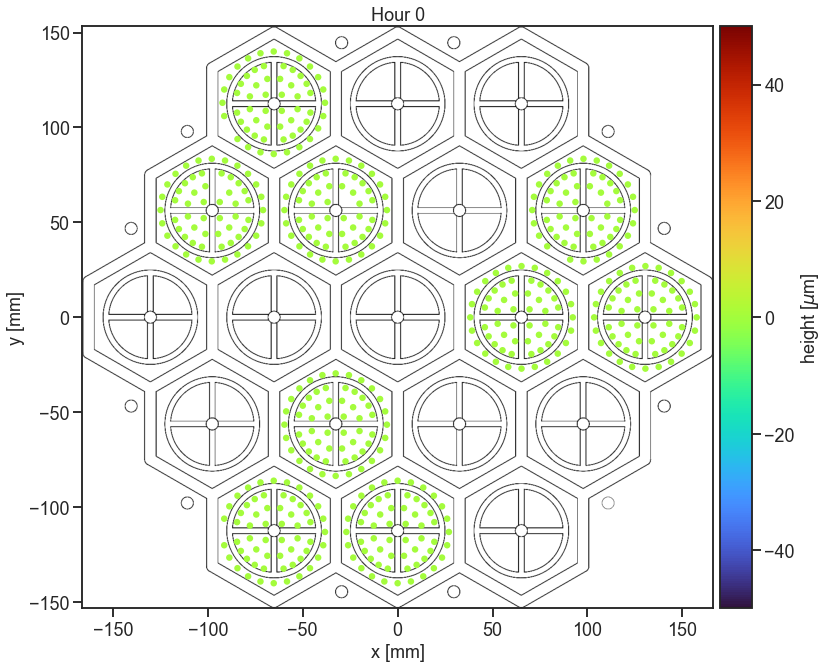

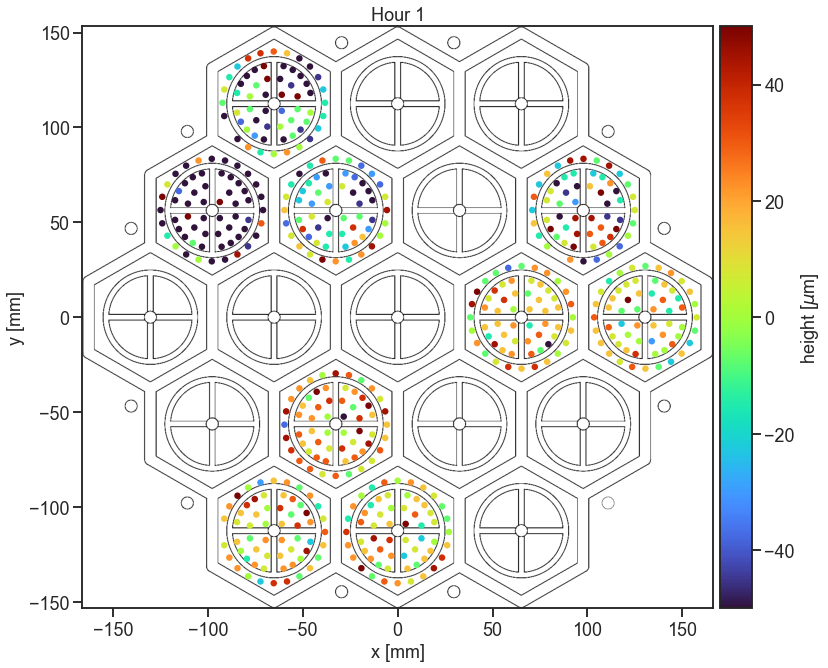

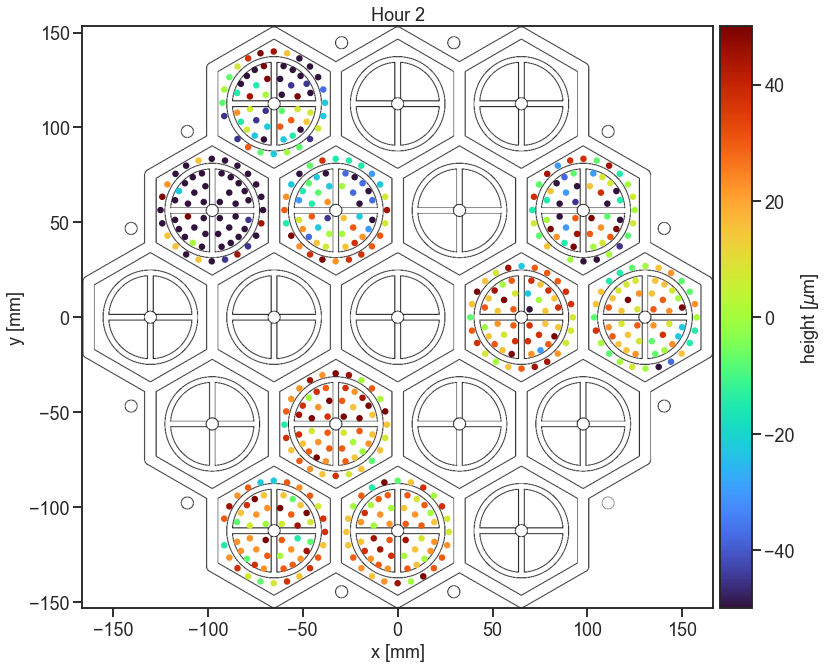

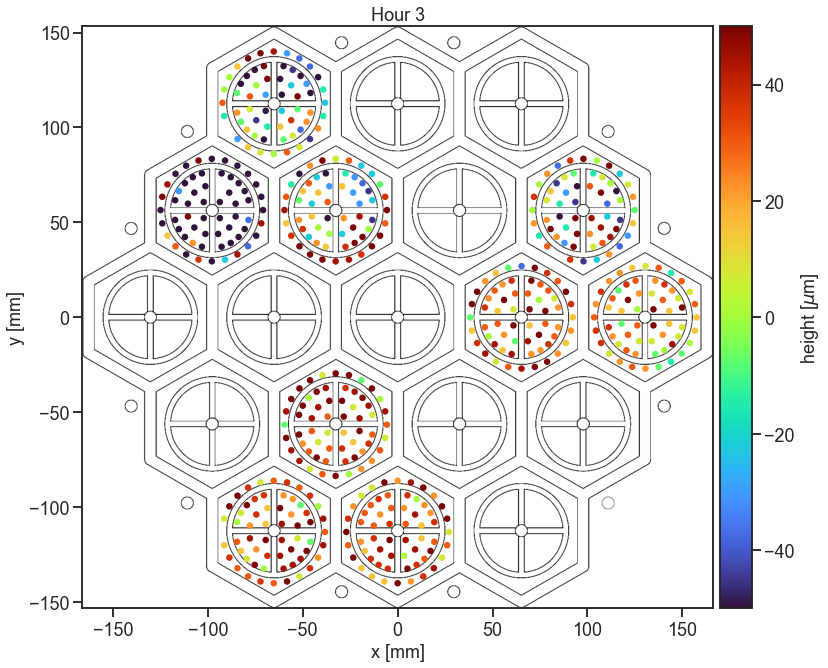

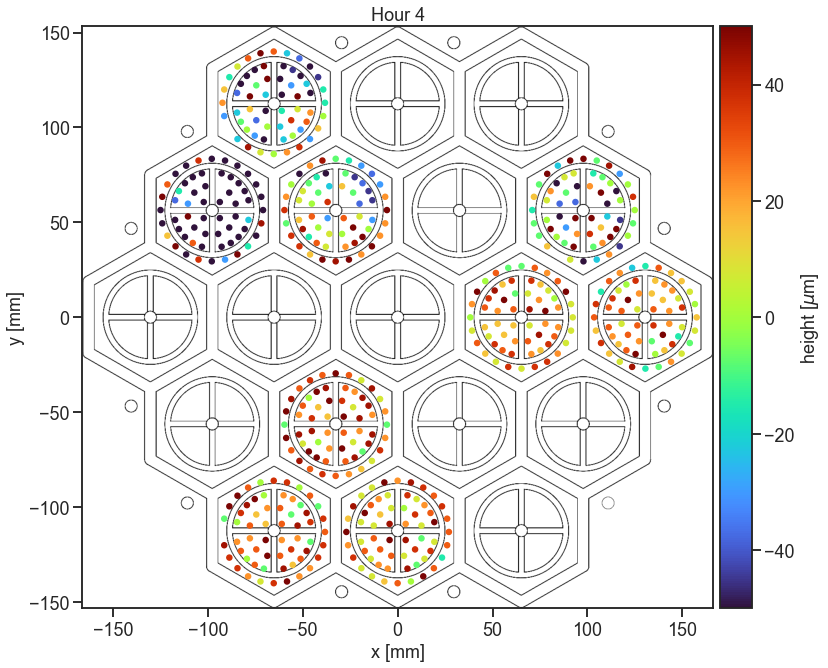

...

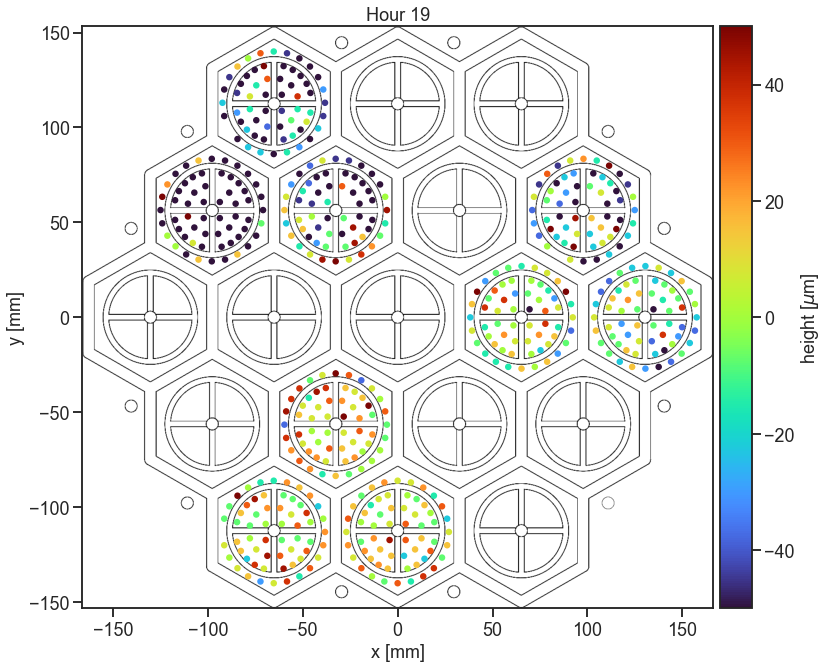

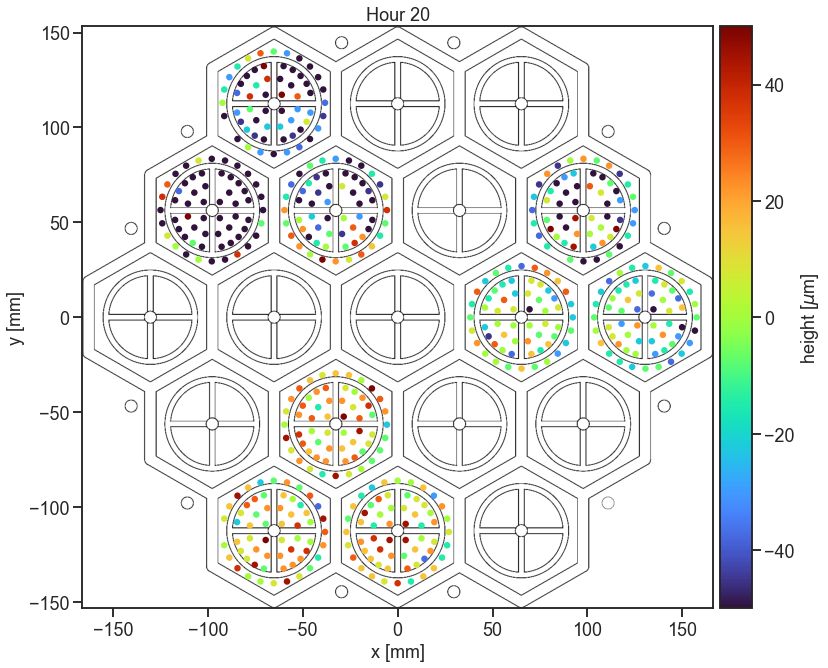

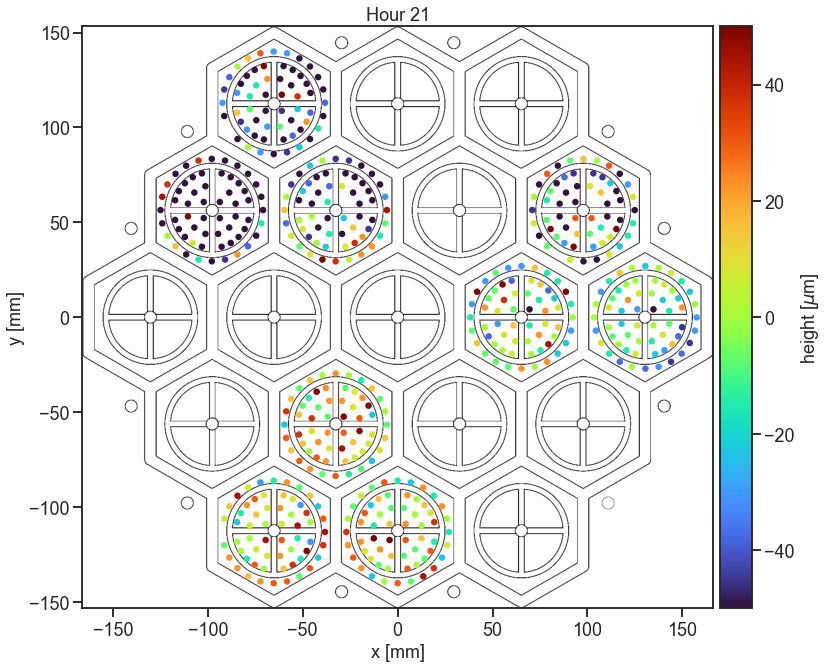

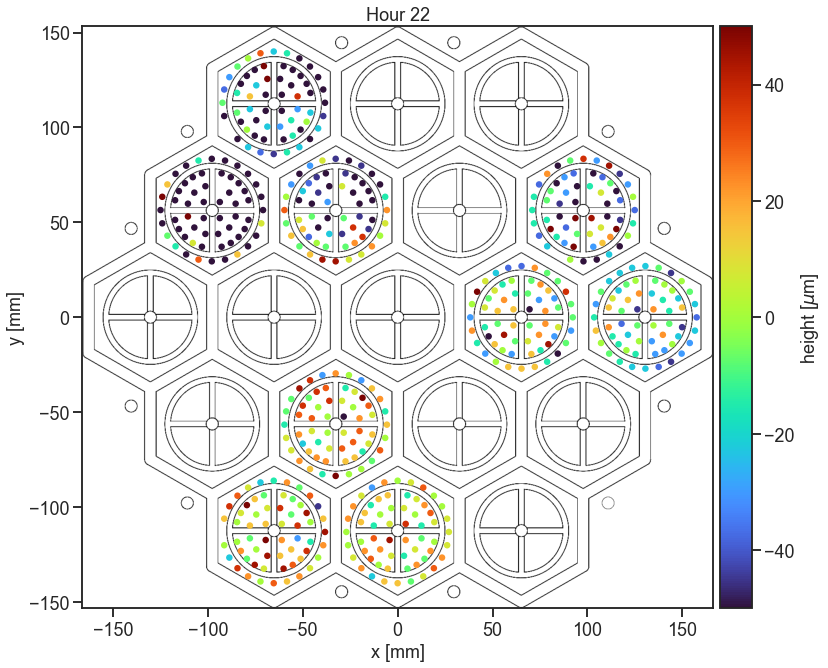

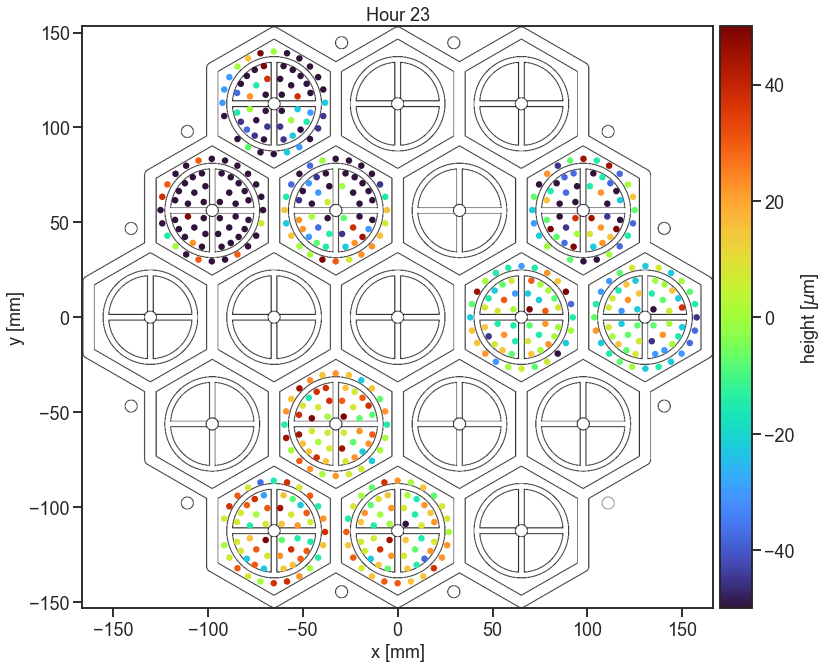

In [ ]:
for key, data in measurements_dict_pt.items(): 
    run_nr = int(key.split('_')[2])
    fig, ax = tdp.full_hexagon_plot(data, mode=('z_mean'), size=5**2, cbar_norm=(-50, 0, 50), cmap='turbo', title=f'Hour {run_nr -1}')
    # fig.savefig(f'Vac_timestory/{run_nr}_Measurement.png', dpi='figure', format='png', metadata=None,
    #     bbox_inches=None, pad_inches=0.1,
    #     facecolor='auto', edgecolor='auto',
    #     backend=None
    #    )
    # plt.close()

# hier kommt jetzt der joyplot

erstmal die funktion schreiben um verteilung von einem triplet in einem run zu sehen 

In [ ]:
# for key, data in measurements_dict_pt.items(): 
#     run_nr = int(key.split('_')[2])
#     data = data.loc[data.trip_color=='blue',:]
#     tdp.ts_hist(data, mode='z_mean')


(<Figure size 432x1008 with 24 Axes>,
 array([<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:xlabel='z [µm]'>], dtype=object))

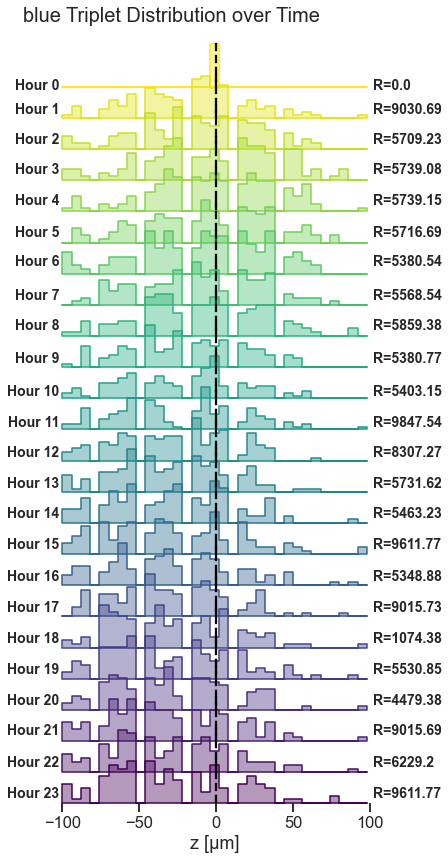

In [ ]:
tdp.plot_triplet_dist_joyplot(measurements_dict_pt, 'blue')

(<Figure size 432x1008 with 24 Axes>,
 array([<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:xlabel='z [µm]'>], dtype=object))

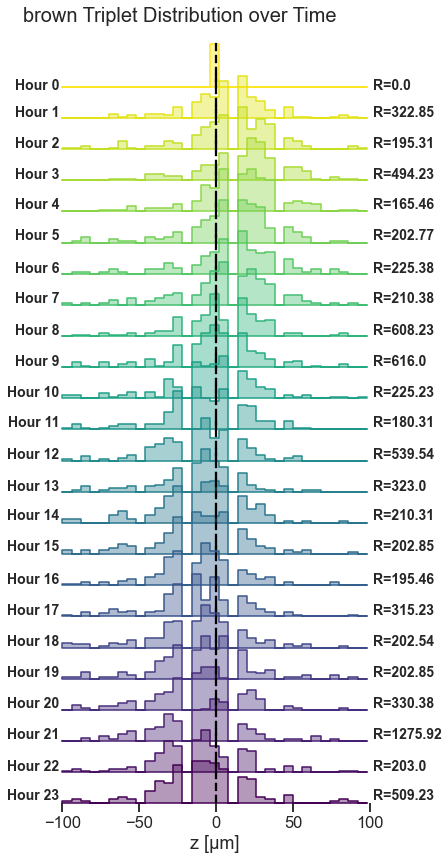

In [ ]:
tdp.plot_triplet_dist_joyplot(measurements_dict_pt, 'brown')

(<Figure size 432x1008 with 24 Axes>,
 array([<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:xlabel='z [µm]'>], dtype=object))

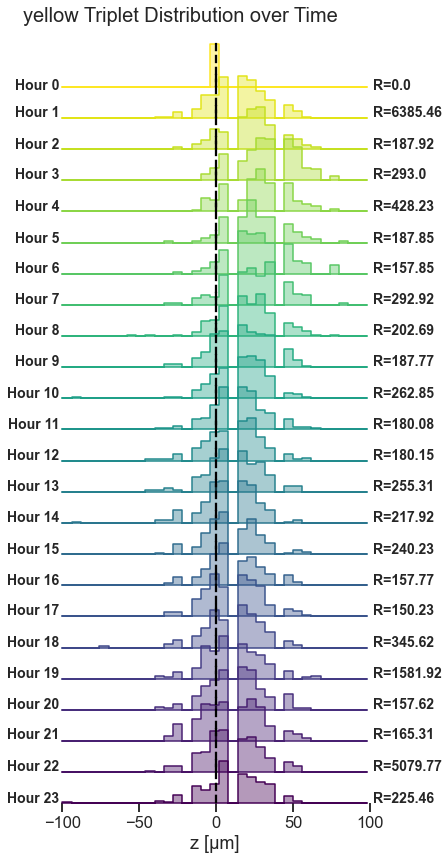

In [ ]:
tdp.plot_triplet_dist_joyplot(measurements_dict_pt, 'yellow')